<a href="https://colab.research.google.com/github/Joovvhan/Master-Thesis/blob/master/log/(PN)N_5_TSNE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import necessary modules

import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wf
import time
import glob
import datetime

from tqdm import trange

# Import Keras modules

from keras.preprocessing import image
from keras.layers import Input, Flatten, Dense, Dropout, GlobalAveragePooling2D
from keras.models import Sequential
from keras import backend as K
from keras.models import load_model


Using TensorFlow backend.


In [0]:
# Mount google drive

# from google.colab import drive
# drive.mount('/content/gdrive')
# os.listdir('gdrive/My Drive/Colab')

In [3]:
from keras.models import load_model

# Set model path

modelPath = 'gdrive/My Drive/Colab/Model'

dataPath = 'gdrive/My Drive/Colab/Data'

dataPath = '''D:\\0_Joowhan's Paper\\Synthesized\\Total\\Impulse'''
modelPath = '''D:\\0_Joowhan's Paper\\Synthesized\\Total\\Model'''

modelList = glob.glob(modelPath + '/*h5')
    
numberModel = np.inf
    
while numberModel >= len(modelList): 

    for i in range(len(modelList)):
        print('#{:d}: {}'.format(i, modelList[i]))
    
    numberModel = int(input('Type In Your Model Number:\n'))

    if numberModel < len(modelList):
        print('Loading {}'.format(modelList[numberModel]))    
        model = load_model(modelList[numberModel])
        print('Loading Completed')    
    else:
        print('Invalid Model Number\n')

#0: D:\0_Joowhan's Paper\Synthesized\Total\Model\(PN)N-F_Xception_11-19-18-39-51.h5
#1: D:\0_Joowhan's Paper\Synthesized\Total\Model\A1F3P3-A5F3P3_ResNet50_10-08-20-03-31.h5
#2: D:\0_Joowhan's Paper\Synthesized\Total\Model\A1F3P3-A5F3P3_ResNet50_10-14-20-58-37.h5
#3: D:\0_Joowhan's Paper\Synthesized\Total\Model\A1F3P3-A5F3P3_Xception_10-08-19-21-36.h5
#4: D:\0_Joowhan's Paper\Synthesized\Total\Model\A1F3P3-A5F3P3_Xception_10-08-19-46-29.h5
#5: D:\0_Joowhan's Paper\Synthesized\Total\Model\A3F1P3-A3F5P3_ResNet50_10-14-14-48-59.h5
#6: D:\0_Joowhan's Paper\Synthesized\Total\Model\A3F1P3-A3F5P3_Xception_10-14-13-00-04.h5
#7: D:\0_Joowhan's Paper\Synthesized\Total\Model\Normal-Fault_ResNet50_10-15-17-07-45.h5
#8: D:\0_Joowhan's Paper\Synthesized\Total\Model\['A1F3P3', 'A2F3P3']-['A5F3P3']_Xception_10-15-11-34-51.h5
#9: D:\0_Joowhan's Paper\Synthesized\Total\Model\['A3F1P3', 'A3F2P3']-['A3F5P3']_Xception_10-15-12-17-11.h5
#10: D:\0_Joowhan's Paper\Synthesized\Total\Model\['A3F1P3', 'A3F2P3']-

In [4]:
creationDate = modelList[numberModel].split('_')[-1].replace('.h5', '')

modelParamList = glob.glob(modelPath + '/*.npy')
modelParam = [param for param in modelParamList if creationDate in param]

print('Parameter npy File List: {}'.format(modelParam))

trainMean = float(np.load([param for param in modelParam if 'mean' in param][0]))
trainStd = float(np.load([param for param in modelParam if 'std' in param][0]))

Parameter npy File List: ["D:\\0_Joowhan's Paper\\Synthesized\\Total\\Model\\mean_11-17-01-10-01.npy", "D:\\0_Joowhan's Paper\\Synthesized\\Total\\Model\\std_11-17-01-10-01.npy"]


In [5]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Model)             (None, 7, 7, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 4098      
Total params: 20,865,578
Trainable params: 20,811,050
Non-trainable params: 54,528
_________________________________________________________________


In [0]:
from keras.models import Model

layer_name = 'flatten_1'

layer_name = 'global_average_pooling2d_1'

intermediate_layer_model = Model(inputs=model.input,
                                 outputs=model.get_layer(layer_name).output)

In [7]:
pathNormal = list()
pathFault = list()
# folderTest = ['A3F2P3', 'A3F3P3', 'A3F4P3']
# folderTest = ['A2F3P3', 'A3F3P3', 'A4F3P3']
# folderNormal = ['A3F1P3']
# folderFault = ['A3F5P3']

folderNormal = ['P3N1']
folderFault = ['P3N5']

pathFaults = [dataPath + '/' + folder for folder in folderFault]
pathNormals = [dataPath + '/' + folder for folder in folderNormal]

for i in range(len(pathNormals)):

    npyNormalPath = glob.glob(pathNormals[i] + '/' + '*Image_With_Label.npy')
    data = np.load(npyNormalPath[0])
    
    imgs = np.moveaxis(np.dstack(data[:, 0]), 2, 0)
    
    label = data[:, 1:5]
    
    if i == 0:
        labelListNormal = label
    else:
        labelListNormal = np.vstack([labelListNormal, label])

    print('Normal Image Shape From {}: {}'.format(folderNormal[i], data.shape))    

    chunkLength = 200

    for j in range(int(len(imgs) / chunkLength)):

        imgsTestChunk = imgs[j * chunkLength:(j + 1) * chunkLength, :, :]

        testImgsNorm = (imgsTestChunk - trainMean) / trainStd

        testImgsNorm = testImgsNorm.reshape(list(testImgsNorm.shape) + [1])

        X_test_ = np.stack([testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0]], axis = -1)

        intermediate_features = intermediate_layer_model.predict(X_test_)
        
        if j == 0:
            features_ = intermediate_features
        else:
            features_ = np.vstack((features_, intermediate_features))
    
    if i == 0:
        normal_features = features_
    else:
        normal_features = np.vstack((normal_features, features_))
        
    del features_
        
    print('Predicted {}/{}'.format(i + 1, len(npyNormalPath)))    
    print('normal_features Shape{}'.format(normal_features.shape))
    print('labelList Shape{}'.format(labelListNormal.shape))
    
    del imgs, data

Normal Image Shape From P3N1: (1000, 4)
Predicted 1/1
normal_features Shape(1000, 2048)
labelList Shape(1000, 3)


In [8]:
for i in range(len(pathFaults)):

    npyFaultPath = glob.glob(pathFaults[i] + '/' + '*Image_With_Label.npy')
    data = np.load(npyFaultPath[0])
    
    imgs = np.moveaxis(np.dstack(data[:, 0]), 2, 0)
    
    label = data[:, 1:5]
    
    if i == 0:
        labelListFault = label
    else:
        labelListFault = np.vstack([labelListFault, label])

    print('Fault Image Shape From {}: {}'.format(folderFault[i], data.shape))    

    chunkLength = 200

    for j in range(int(len(imgs) / chunkLength)):

        imgsTestChunk = imgs[j * chunkLength:(j + 1) * chunkLength, :, :]

        testImgsNorm = (imgsTestChunk - trainMean) / trainStd

        testImgsNorm = testImgsNorm.reshape(list(testImgsNorm.shape) + [1])

        X_test_ = np.stack([testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0]], axis = -1)

        intermediate_features = intermediate_layer_model.predict(X_test_)
        
        if j == 0:
            features_ = intermediate_features
        else:
            features_ = np.vstack((features_, intermediate_features))
    
    if i == 0:
        fault_features = features_
    else:
        fault_features = np.vstack((fault_features, features_))
        
    del features_
        
    print('Predicted {}/{}'.format(i + 1, len(npyFaultPath)))    
    print('fault_features Shape{}'.format(fault_features.shape))
    print('labelList Shape{}'.format(labelListFault.shape))
    
    del imgs, data

Fault Image Shape From P3N5: (1000, 4)
Predicted 1/1
fault_features Shape(1000, 2048)
labelList Shape(1000, 3)


In [12]:
pathTest = list()

# folderTest = ['A3F1P3', 'A3F2P3', 'A3F3P3', 'A3F4P3', 'A3F5P3']

folderTest = list()

for x in range(3, 4):
    for y in range(1, 6):
        folderTest.append('P{}N{}'.format(x, y))


for i in range(len(folderTest)):
    pathTest.append(dataPath + '/' + folderTest[i])
    
pathTests = [dataPath + '/' + folder for folder in folderTest]

startNum = 0

for i in range(len(pathTests)):

    npyTestPath = glob.glob(pathTests[i] + '/' + '*Image_With_Label.npy')
    data = np.load(npyTestPath[0])
    
    imgs = np.moveaxis(np.dstack(data[:, 0]), 2, 0)
    
    label = data[:, 1:5]
    
    if i == 0:
        labelListTest = label
    else:
        labelListTest = np.vstack([labelListTest, label])

    print('Test Image Shape From {}: {}'.format(folderTest[i], data.shape))    

    chunkLength = 200

    for j in range(int(len(imgs) / chunkLength)):

        imgsTestChunk = imgs[j * chunkLength:(j + 1) * chunkLength, :, :]

        testImgsNorm = (imgsTestChunk - trainMean) / trainStd

        testImgsNorm = testImgsNorm.reshape(list(testImgsNorm.shape) + [1])

        X_test_ = np.stack([testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0], testImgsNorm[:, :, :, 0]], axis = -1)

        intermediate_features = intermediate_layer_model.predict(X_test_)
        
        if j == 0:
            features_ = intermediate_features
        else:
            features_ = np.vstack((features_, intermediate_features))
    
    if i == 0:
        test_features = features_
    else:
        test_features = np.vstack((test_features, features_))
        
    del features_
        
    print('Predicted {}/{}'.format(i + 1, len(npyFaultPath)))    
    print('fault_features Shape{}'.format(fault_features.shape))
    print('labelList Shape{}'.format(labelListFault.shape))
    
    del imgs, data

Test Image Shape From P3N1: (1000, 4)
Predicted 1/1
fault_features Shape(1000, 2048)
labelList Shape(1000, 3)
Test Image Shape From P3N2: (1000, 4)
Predicted 2/1
fault_features Shape(1000, 2048)
labelList Shape(1000, 3)
Test Image Shape From P3N3: (1000, 4)
Predicted 3/1
fault_features Shape(1000, 2048)
labelList Shape(1000, 3)
Test Image Shape From P3N4: (1000, 4)
Predicted 4/1
fault_features Shape(1000, 2048)
labelList Shape(1000, 3)
Test Image Shape From P3N5: (1000, 4)
Predicted 5/1
fault_features Shape(1000, 2048)
labelList Shape(1000, 3)


In [0]:
import numpy as np
from sklearn.manifold import TSNE

test_features

tsne = TSNE(n_components = 2, random_state = 0)
full_tsne_result = tsne._fit(test_features)

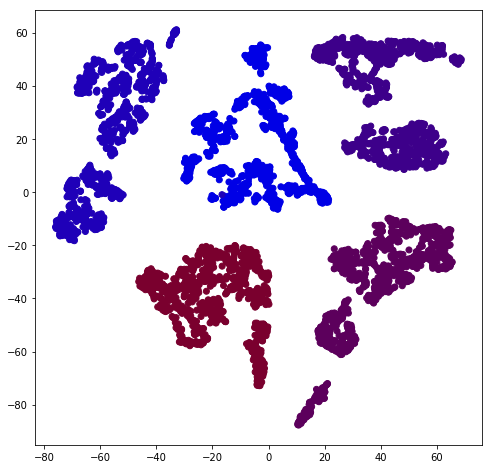

In [14]:
red = np.array([0.6, 0, 0, 0.2])
blue = np.array([0, 0, 0.9, 0.2])

red = np.array([0.6, 0, 0, 1])
blue = np.array([0, 0, 0.9, 1])

Y_label = np.concatenate([np.zeros(1000), 0.2 * np.ones(1000), 0.4 * np.ones(1000), 0.6 * np.ones(1000), 0.8 * np.ones(1000)])

clusterColor = [red * label + blue * (1 - label) for label in Y_label]

plt.figure(figsize=(8, 8))
plt.scatter(x = full_tsne_result[:, 0], y=full_tsne_result[:, 1], color=clusterColor)


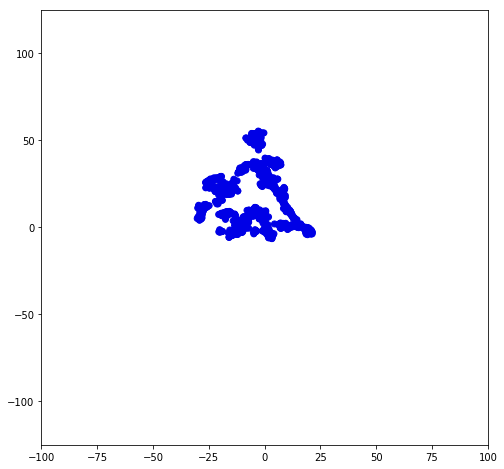

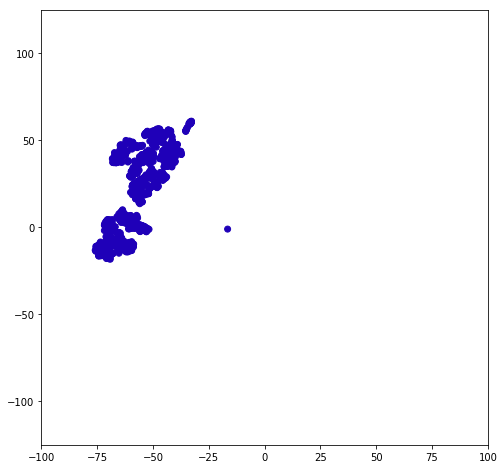

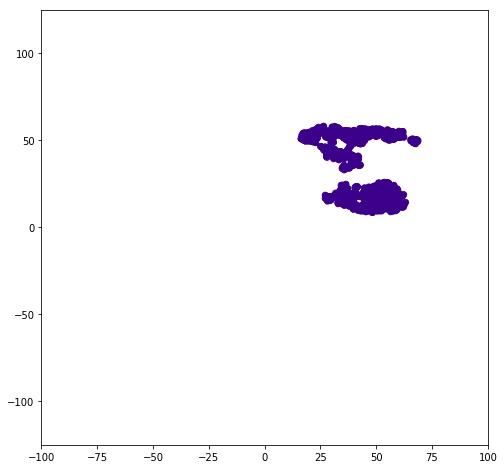

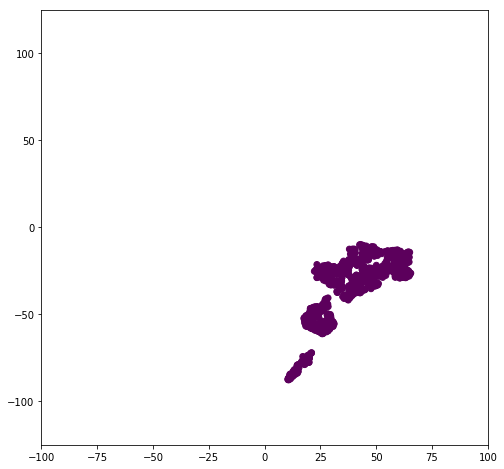

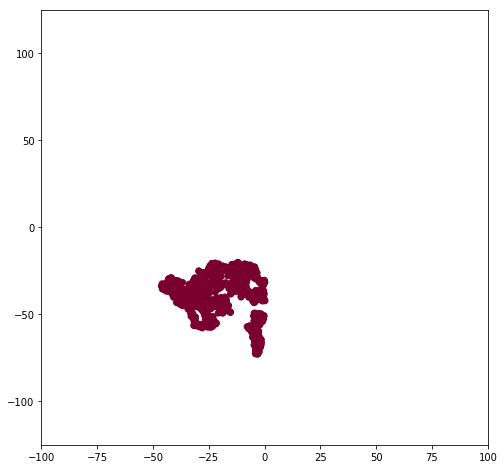

In [15]:
for i in range(0, 5000, 1000):

    plt.figure(figsize=(8, 8))
    plt.scatter(x = full_tsne_result[i:i+1000, 0], y=full_tsne_result[i:i+1000, 1], color=clusterColor[i:i+1000])
    plt.xlim([-100, 100])
    plt.ylim([-125, 125])
    plt.show()

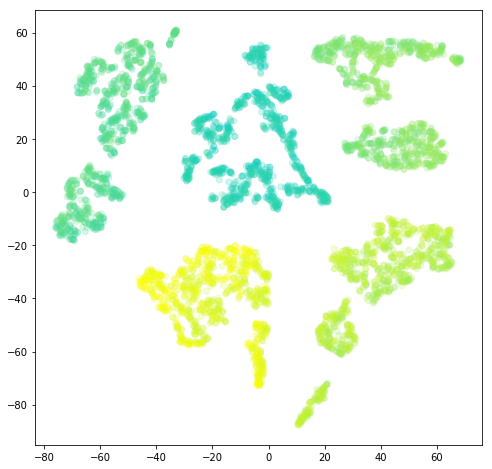

In [18]:
from operator import itemgetter

TSNE_table = np.concatenate((full_tsne_result, labelListTest), axis = 1)

TSNE_table_sorted = np.asarray(sorted(TSNE_table, key = itemgetter(3)))

# itemgetter
# 2: Amplitude
# 3: Frequency
# 4: Modulation
# 5: Harmonic

colorYellow = np.asarray([1, 1, 0, 0.2])
colorBGreen = np.asarray([0, 0.8, 0.8, 0.2])

clusterColor_ = np.asarray([colorYellow * i/len(TSNE_table_sorted) + colorBGreen * (1 - i/len(TSNE_table_sorted)) for i in range(len(TSNE_table_sorted))])

plt.figure(figsize=(8, 8))
# plt.scatter(x = pca_result[:, 0], y=pca_result[:, 1], color=clusterColor)
plt.scatter(x = TSNE_table_sorted[:,0], y=TSNE_table_sorted[:,1], color=clusterColor_)

In [19]:
TSNE_table.shape

(5000, 5)

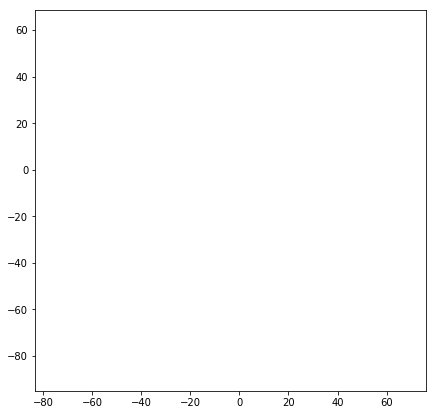

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from matplotlib import animation, rc
from IPython.display import display, HTML

rc('animation', html='jshtml')

# Create new Figure and an Axes which fills it.
fig = plt.figure(figsize=(7, 7))
# ax = fig.add_axes([0, 0, 1, 1])
ax = fig.add_subplot(111)
# ax.set_xlim(-5, 10)
# ax.set_ylim(-5, 5)
# Construct the scatter which we will update during animation
# as the raindrops develop.
x, y = [], []

scat = ax.scatter(TSNE_table_sorted[:, 0], TSNE_table_sorted[:, 1], color = clusterColor_)

def update(frame_number):
    x = TSNE_table_sorted[:frame_number,0]
    y = TSNE_table_sorted[:frame_number,1]
    scat.set_offsets(np.c_[x, y])

    return scat,

# Construct the animation, using the update function as the animation
# director.
animation = FuncAnimation(fig, update, frames=np.asarray(range(0, 5000, 50)), interval=100)

In [21]:
animation